In [1]:
# imports 
from imageai.Detection import ObjectDetection

import cv2

import matplotlib.pyplot as plt

from PIL import Image, ImageEnhance

import os

In [2]:
detector = ObjectDetection()

In [48]:
cap = cv2.VideoCapture(0)

cv2.namedWindow("Webcam Feed")

while True:
    ret, frame = cap.read()

    cv2.imshow("Webcam Feed", frame)

    key = cv2.waitKey(1) & 0xFF

    if key == ord(" "):
        input_path = "./input/test.jpg"
        cv2.imwrite(input_path, frame)
        break

cap.release()
cv2.destroyAllWindows()

image = cv2.imread(input_path)

In [3]:
model_path = "./models/retinanet.pth"

input_path = "./input/test.jpg"

output_path = "./output/newimage.jpg"

In [4]:
# bottle images
b1 = './input/bottle/B1.jpg'
b2 = './input/bottle/B2.jpg'
b3 = './input/bottle/B3.jpg'
b4 = './input/bottle/B4.jpg'
b5 = './input/bottle/B5.jpg'
b6 = './input/bottle/B6.jpg'

nametag = ['B1.jpg', 'B2.jpg', 'B3.jpg', 'B4.jpg', 'B5.jpg', 'B6.jpg']

brightness_threshold = 100

# resize 

resize = 0.6

t1 = Image.open(b1)
b1 = t1.resize((int(t1.width*resize), int(t1.height*resize)))

t2 = Image.open(b2)
b2 = t2.resize((int(t2.width*resize), int(t2.height*resize)))

t3 = Image.open(b3)
b3 = t3.resize((int(t3.width*resize), int(t3.height*resize)))

t4 = Image.open(b4)
b4 = t4.resize((int(t4.width*resize), int(t4.height*resize)))

t5 = Image.open(b5)
b5 = t5.resize((int(t5.width*resize), int(t5.height*resize)))

t6 = Image.open(b6)
b6 = t6.resize((int(t6.width*resize), int(t6.height*resize)))


In [5]:
def darkdetector(image_path, threshold):
    image = Image.open(image_path).convert('L')
    width, height = image.size
    pixels = image.getdata()
    
    total_brightness = sum(pixels)
    average_brightness = total_brightness / (width * height)
    
    return average_brightness < threshold

def enhancer(image_path, brightness_threshold, saturation_factor, contrast_factor):
    image = Image.open(image_path)
    
    enhancer = ImageEnhance.Brightness(image)
    image = enhancer.enhance(brightness_threshold)
    
    enhancer = ImageEnhance.Color(image)
    image = enhancer.enhance(saturation_factor)
    
    enchaner = ImageEnhance.Contrast(image)
    image = enchaner.enhance(contrast_factor)
    
    return image

In [44]:
# loop through all the images and check if they are dark or not

for nametags in nametag:
    image_path = './input/bottle/' + nametags
    new_image_path = './output/' + nametags
    if darkdetector(image_path, brightness_threshold):
        print(nametags + ' is dark')
        brightened_image = enhancer(image_path, 1.5, 0.8, 1.2)
        # delete the previous image
        os.remove(new_image_path)
        brightened_image.save(new_image_path)
        print('replaced: '  + nametags)
    else:
        print(nametags + ' is ok!') 
        # save the image 
        normal_image = Image.open(image_path)
        normal_image.save(new_image_path)

B1.jpg is ok!
B2.jpg is dark
replaced: B2.jpg
B3.jpg is ok!
B4.jpg is dark
replaced: B4.jpg
B5.jpg is ok!
B6.jpg is dark
replaced: B6.jpg


In [ ]:
# loop 10 times
for i in range(1,11):
    for nametags in nametag:
        image_path = './input/bottle/' + nametags
        new_image_path = './output/' + nametags
        
        if darkdetector(image_path, brightness_threshold):
            print(nametags + ' is dark')
            brightened_image = enhancer(image_path, 1.5, 0.8, 1.2)
            # if there is a previous image, delete it
            if os.path.exists(new_image_path):
                os.remove(new_image_path)
            brightened_image.save(new_image_path)
            print('replaced: '  + nametags)
        else:
            print(nametags + ' is ok!') 
            # save the image 
            normal_image = Image.open(image_path)
            normal_image.save(new_image_path)
            

In [6]:
detector.setModelTypeAsRetinaNet()
detector.setModelPath(model_path)
detector.loadModel() 

e:\python\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
e:\python\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
e:\python\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained_backbone' is deprecated since 0.13 and may be removed in the future, please use 'weights_backbone' instead.
  warnings.warn(
e:\python\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=None`.
  warnings.warn

In [53]:
# detection on one image
detections = detector.detectObjectsFromImage(input_image=input_path, 
                                             output_image_path=output_path, 
                                             minimum_percentage_probability=30)

# if detections:
#     # Display the output image
#     print("Objects detected.")
#     for eachItem in detections:
#         print(eachItem["name"] , " : ", eachItem["percentage_probability"], " : ", eachItem["box_points"] )
# else:
#     print("No objects detected.")


In [7]:
for i in range(1,7):

    # detection on one image
    detections = detector.detectObjectsFromImage(input_image=eval('b'+str(i)), 
                                                 output_image_path='./output/b'+str(i)+'.jpg', 
                                                 minimum_percentage_probability=30)

    # Display the output image
    print("Objects detected.")
    for eachItem in detections:
        print(eachItem["name"] , " : ", eachItem["percentage_probability"])
    else:
        print("No objects detected.")

Objects detected.
bottle  :  89.88
bottle  :  88.95
bottle  :  87.41
sports ball  :  78.91
mouse  :  72.62
remote  :  57.14
scissors  :  54.15
No objects detected.
Objects detected.
bottle  :  90.96
mouse  :  86.17
bottle  :  83.55
bottle  :  78.88
sports ball  :  73.91
bottle  :  61.16
No objects detected.
Objects detected.
bottle  :  88.33
bottle  :  86.29
bottle  :  84.31
sports ball  :  81.33
remote  :  76.3
scissors  :  57.31
mouse  :  53.0
No objects detected.
Objects detected.
bottle  :  84.99
mouse  :  82.86
bottle  :  65.51
bottle  :  65.31
No objects detected.
Objects detected.
bottle  :  89.2
bottle  :  87.82
bottle  :  83.21
mouse  :  75.02
scissors  :  69.06
sports ball  :  66.87
remote  :  61.04
No objects detected.
Objects detected.
mouse  :  90.91
bottle  :  87.66
bottle  :  84.19
bottle  :  81.85
sports ball  :  52.67
No objects detected.


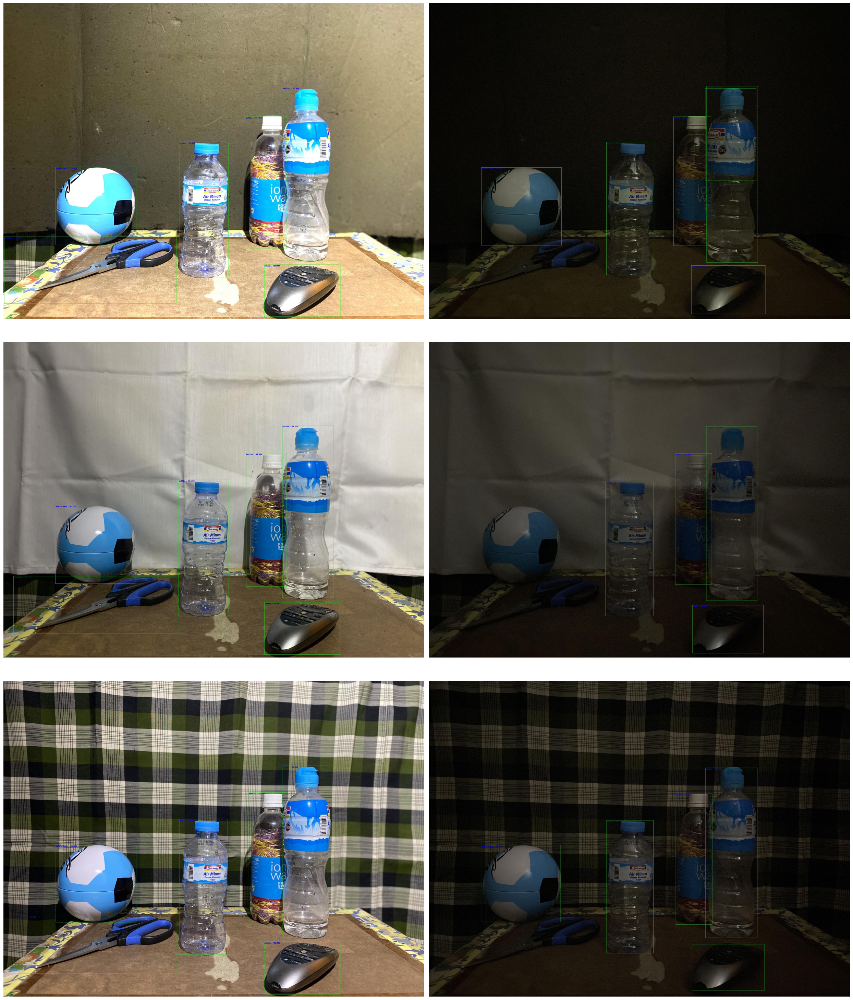

In [8]:

fig = plt.figure(figsize=(25,30))

ax1 = fig.add_subplot(321)
ax1.imshow(plt.imread('./output/b1.jpg'))
ax1.axis('off')

ax2 = fig.add_subplot(322)
ax2.imshow(plt.imread('./output/b2.jpg'))
ax2.axis('off')

ax3 = fig.add_subplot(323)
ax3.imshow(plt.imread('./output/b3.jpg'))
ax3.axis('off')

ax4 = fig.add_subplot(324)
ax4.imshow(plt.imread('./output/b4.jpg'))
ax4.axis('off')

ax5 = fig.add_subplot(325)
ax5.imshow(plt.imread('./output/b5.jpg'))
ax5.axis('off')

ax6 = fig.add_subplot(326)
ax6.imshow(plt.imread('./output/b6.jpg'))
ax6.axis('off')

plt.tight_layout()
plt.show()

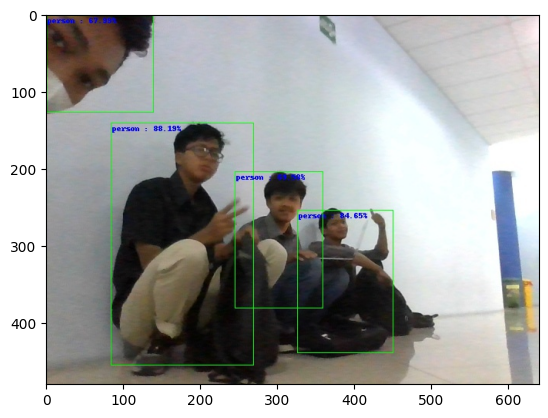

In [51]:
input_image = plt.imread(input_path)
output_image = plt.imread(output_path)

# fig, ax = plt.subplots(1, 2, figsize=(20, 10))
# ax[0].imshow(input_image)
# ax[1].imshow(output_image)

# show output image in fullsize
plt.imshow(output_image)